# Машинное обучение, ВМК МГУ

# Практическое задание 2. Обучение без учителя.

## Общая информация
Дата выдачи: 19.03.2023

Мягкий дедлайн: 03.04.2021 23:59 MSK **(за каждый день просрочки снимается 1 балл)**

Жёсткий дедлайн: 10.04.2021 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — **10 баллов + 4.4 бонусов**.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-02-Username.ipynb

Username — ваша фамилия на латинице

<p style="color:#de3815;font-size:25px;">
Напоминание об оформлении и выполнении ноутбука
</p>

* Все строчки должны быть выполнены. Нужно, чтобы output команды можно было увидеть, не запуская ячейки (кроме редких случаев, когда необходимо намеренно скрыть ненужный output, про такие случаи желательно писать пояснения в тексте). **В противном случае -1 балл**
* При оформлении ДЗ нужно пользоваться данным файлом в качестве шаблона. Не нужно удалять и видоизменять написанный код и текст, если явно не указана такая возможность. **В противном случае -1 балл**
* В anytask обязательно нужно прикреплять отдельно файл с расширением ipynb (не в архиве, а именно отдельно). Если необходимо отправить еще какие-то файлы, то вынесите их в отдельный архив (если файлов много) и пришлите. **В противном случае -0.5 балла**
---
* Пишите, пожалуйста, выводы и ответы на вопросы в текстовых ячейках/при помощи print в коде. При их отсутствии мы не можем понять, сделали ли вы задание и понимаете, что происходит, и **поэтому будем снижать баллы**
* Если алгоритм не сказано реализовывать явно, его всегда можно импортировать из библиотеки.
---
* Про графики. _Штрафы будут применяться к каждому результату команды отображения графика (plt.show() и др. аналогичные). Исключением являются графики, генерируемые функциями каких-либо сторонних библиотек, если их нельзя кастомизировать_

    * должно быть название (plt.title) графика; **В противном случае &ndash; -0.05 балла**
    * на графиках должны быть подписаны оси (plt.xlabel, plt.ylabel); **В противном случае &ndash; -0.025 балла за каждую ось**
    * должны быть подписаны единицы измерения (если это возможно); **В противном случае &ndash; -0.025 балла за каждую ось**
    * все названия должны быть понятны любому человеку, знакомому с терминологией, без заглядывания в код; **В противном случае &ndash; -0.05 балла**
    * подписи тиков на осях не должны сливаться как на одной оси, так и между ними; **В противном случае &ndash; -0.025 балла за каждую ось**
    * если изображено несколько сущностей на одном холсте (например несколько функций), то необходима поясняющая легенда (plt.legend); **В противном случае &ndash; -0.05 балла**
    * все линии на графиках должны быть чётко видны (нет похожих цветов или цветов, сливающихся с фоном); **В противном случае &ndash; -0.05 балла**
    * если отображена величина, имеющая очевидный диапазон значений (например, проценты могут быть от 0 до 100), то желательно масштабировать ось на весь диапазон значений (исключением является случай, когда вам необходимо показать малое отличие, которое незаметно в таких масштабах);
    * графики должны быть не супер-микро и не супер-макро по размерам, так, чтобы можно было увидеть все, что нужно.
    * при необходимости улучшения наглядности графиков, можно пользоваться логарифмической шкалой по осям x/y.
    

### А также..

* Для удобства поиска вопросов, на которые от вас просят ответа, мы пометили их знаком **(?)**
* Знак **(!)** означает, что выполнение замечания необходимо для **возможности получения полного балла**
* Даем до +0.3 баллов за выдающиеся успехи по субъективному мнению проверяющих. Этот **бонус** не апеллируется

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



**Замечание:**
* seed менять нежелательно

In [3]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции/семинаре. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [4]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans, DBSCAN


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
        diag = X.sum(axis=1)
        D = np.diag(diag)
        L = D - X
        w,v = np.linalg.eigh(L)
        return v[:, w.argsort()[:self.n_components]]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [3]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

**Замечание**
* Для возможности получения **полного балла** assert должны проходить

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

**Замечание**
* (?) Напишите, пожалуйста, откуда в итоге скачивали данные. 

Данные были скачены по первой ссылке

In [157]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [5]:
import folium

map_ = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map_)
map_

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать из оставшихся (не включенных еще в маршрут) точек, как самую близкую к последней найденной точке (последней, включенной в маршрут)

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [6]:
from haversine import haversine

In [7]:
def split_func(s):
        return s.split('; ')

def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    data_new = data['RouteNumbers_en'].apply(split_func)
    routes = np.unique(data_new.explode())
    res = {}
    for r in routes:
        ind = data_new.explode()[data_new.explode() == r].index
        res[r] = np.array(ind)
    return res

def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    res = {}
    for r in routes.keys():
        stops = routes[r]
        sort = []
        dist = np.zeros((stops.shape[0], stops.shape[0]))
        for i in range(len(stops)):
            dist[i, i] = 10000000
            for j in range(i+1, len(stops)):                
                coor_i = np.array(data.loc[stops[i]][['Latitude_WGS84_en', 'Longitude_WGS84_en']])
                coor_j = np.array(data.loc[stops[j]][['Latitude_WGS84_en', 'Longitude_WGS84_en']])
                distance = haversine(coor_i, coor_j)
                dist[i, j] = distance
                dist[j, i] = distance
        curr = dist.sum(axis=1).argmax()
        for _ in range(len(stops)):
            idx = dist[curr].argmin()
            dist[:, curr] = 10000000
            sort.append(stops[curr])
            curr = idx
        res[r] = sort
    return res


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    graph = np.zeros((data.shape[0], data.shape[0]))
    for r in sorted_routes.keys():
        stops = sorted_routes[r]
        for i in range(len(stops)-1):
            graph[stops[i], stops[i+1]] += 1
            graph[stops[i+1], stops[i]] += 1
    return graph

In [8]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [9]:
map_ = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map_)

map_

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [70]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    map_ = folium.Map([55.75215, 37.61819], zoom_start=12)
    colors = ['red', 'green', 'yellow', 'blue', 'deeppink', 'orange', 'cyan', 'purple', 'lime', 
              'coral', 'gold', 'silver', 'brown', 'plum', 'snow', 'dimgray', 'teal', 'black']
    for id, row in data.iterrows():
        folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                      radius=10, color=colors[labels[id]]).add_to(map_)

    return map_

**Задание 1.4 (1.5 балла)**. 

* **(0.25 балла)** Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. В этом пункте используйте дефолтные параметры.
* **(0.25 балла)** Визуализируйте результат кластеризации из предыдущего пункта с помощью функции `draw_clustered_map`.
* **(0.75 балла)** А теперь подберите с помощью **кросс-валидации** параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации. В качестве метрики качества можете использовать `silhouette_score`. Визуализируйте полученные результаты для всех трех алгоритмов на *оптимальных параметрах*
* (?) Проинтерпретируйте полученные результаты.
 * **(0.1 балла)** Чем отличаются разбиения на кластеры, получаемые разными алгоритмами?
 * **(0.1 балла)** Какие плюсы и минусы есть у каждого алгоритма?
 * **(0.05 балла)** Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Подсказка:**
* Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).
* Обращайте внимание на баланс объектов в кластерах.

Продемонстрируем результаты на дефолтных гиперпараметрах 

In [24]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
kmeans = KMeans()
labels= kmeans.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])

In [25]:
np.unique(labels, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 array([160, 120, 118, 112, 147,  95, 151, 134], dtype=int64))

In [26]:
draw_clustered_map(data, labels)

In [88]:
graph_clustering = GraphClustering()
labels = graph_clustering.fit_predict(adjacency_matrix)
draw_clustered_map(data, labels)

In [53]:
dbscan = DBSCAN()
labels= dbscan.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
draw_clustered_map(data, labels)

Теперь подберём гиперпараметры. Начнём KMeans запустим алгоритм для k = [2, 10] и продемонстрируем лучший результат

In [52]:
kmeans = KMeans(n_clusters=2)
labels= kmeans.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [51]:
kmeans = KMeans(n_clusters=3)
labels= kmeans.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [50]:
kmeans = KMeans(n_clusters=4)
labels= kmeans.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [49]:
kmeans = KMeans(n_clusters=5)
labels= kmeans.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [48]:
kmeans = KMeans(n_clusters=6)
labels= kmeans.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [47]:
kmeans = KMeans(n_clusters=7)
labels= kmeans.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [46]:
kmeans = KMeans(n_clusters=8)
labels= kmeans.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [45]:
kmeans = KMeans(n_clusters=9)
labels= kmeans.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [44]:
kmeans = KMeans(n_clusters=10)
labels= kmeans.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

Визуально кажется, что наилучшим значением будем 7 кластеров

In [43]:
kmeans = KMeans(n_clusters=7)
labels= kmeans.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
draw_clustered_map(data, labels)

Подберём теперь eps для DBSCAN (шумовые точки будем помечать чёрным). Возьмём его в пределах [0.004, 0.005]

In [87]:
dbscan = DBSCAN(eps=0.004)
labels= dbscan.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [86]:
dbscan = DBSCAN(eps=0.0042)
labels= dbscan.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [85]:
dbscan = DBSCAN(eps=0.0043)
labels= dbscan.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [84]:
dbscan = DBSCAN(eps=0.0044)
labels= dbscan.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [83]:
dbscan = DBSCAN(eps=0.0045)
labels= dbscan.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [82]:
dbscan = DBSCAN(eps=0.0046)
labels= dbscan.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

In [81]:
dbscan = DBSCAN(eps=0.0048)
labels= dbscan.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
#draw_clustered_map(data, labels)

Довольно сложно подобрать этот гиперпараметр. Но чтобы получить больше одного кластера и не получить миллион очень маленьких кластреров(некоторые из которых будут содержаться в других), необходимо взять eps между 0.0044 и 0.0045. Возмём 0.00445

In [80]:
dbscan = DBSCAN(eps=0.00445)
labels= dbscan.fit_predict(data[['Latitude_WGS84_en', 'Longitude_WGS84_en']])
draw_clustered_map(data, labels)

Наконец, подберём n_clusters и n_components у спектральной кластеризации. KMeans выдал хорошее распределение на 7 кластеров, поэтому зафиксируем этот параметр и подберём n_components

In [142]:
graph_clustering = GraphClustering(n_components =10, n_clusters = 7)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [141]:
graph_clustering = GraphClustering(n_components = 12, n_clusters = 7)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [140]:
graph_clustering = GraphClustering(n_components = 13, n_clusters = 7)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [139]:
graph_clustering = GraphClustering(n_components = 14, n_clusters = 7)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [138]:
graph_clustering = GraphClustering(n_components =15, n_clusters = 7)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [189]:
graph_clustering = GraphClustering(n_components =20, n_clusters = 7)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

Зафиксируем n_components=15 и подберём количество кластеров

In [178]:
graph_clustering = GraphClustering(n_components = 15, n_clusters = 4)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [136]:
graph_clustering = GraphClustering(n_components = 15, n_clusters = 5)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [135]:
graph_clustering = GraphClustering(n_components = 15, n_clusters = 6)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [134]:
graph_clustering = GraphClustering(n_components = 15, n_clusters = 7)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [133]:
graph_clustering = GraphClustering(n_components = 15, n_clusters = 9)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [132]:
graph_clustering = GraphClustering(n_components = 15, n_clusters = 11)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [131]:
graph_clustering = GraphClustering(n_components = 15, n_clusters = 12)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [183]:
graph_clustering = GraphClustering(n_components = 15, n_clusters = 13)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

In [186]:
graph_clustering = GraphClustering(n_components = 15, n_clusters = 15)
labels = graph_clustering.fit_predict(adjacency_matrix)
#draw_clustered_map(data, labels)

Заметим, что спектральная кластеризация выделяет 6 больших кластеров, если задать большее число n_clusters. Однако, если задать их число равным 5-7, то выделится всего 3-4 кластера... Визульно лучше подходит n_components = 15, n_clusters = 13. Однако тогда, будет ещё много мелких кластеров, которые находятся внутри больших.

In [182]:
graph_clustering = GraphClustering(n_components = 15, n_clusters = 13)
labels = graph_clustering.fit_predict(adjacency_matrix)
draw_clustered_map(data, labels)

**Ваш ответ здесь:**

Кажется, что в этой задаче, KMeans является наиболее подходящим для кластеризации. Он хорошо и чётко находит границы кластеров. DBSCAN сильно зависит от eps. Поэтому он может объединить все остановки в одну группу, т.к. они находятся достаточно близко друг к другу. Либо он может отметить несколько мелких кластеров, которые находятся чуть поодаль от центра. Однако, к плюсам данного метода можно отнести то, что он помечает некоторые объекты шумом. Спектральная кластеризация так же не очень подходит к данной задаче, т.к. некоторые маршруты проходят церез весь ЦАО, поэтому самые южные остановки могут попасть в один кластер с самыми северными. Поэтому будет либо очень мало "адекватных" кластеров, либо будет несколько нормальных, но в них будет много мелких...

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [5]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1289,politics,394.txt,Economy focus for election battle,Britain's economic future will be at the hear...
1872,tech,049.txt,Domain system scam fear,A system to make it easier to create website ...
1044,politics,149.txt,Blair returns from peace mission,Prime Minister Tony Blair has arrived back fr...
654,entertainment,145.txt,Sir Paul rocks Super Bowl crowds,Sir Paul McCartney wowed fans with a live min...
134,business,135.txt,Feta cheese battle reaches court,A row over whether only Greece should be allo...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть🙈, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [6]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [7]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to C:\Users\vk-
[nltk_data]     ks\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\vk-
[nltk_data]     ks\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\vk-
[nltk_data]     ks\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [8]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [9]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [10]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

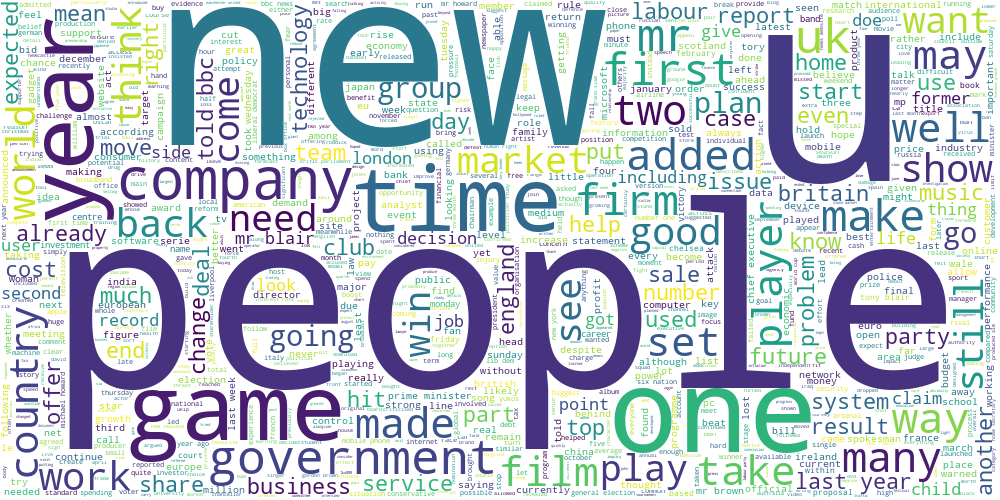

In [152]:
draw_wordcloud(data.text)

-----

**Задание 2.1 (1 балл).** 

* **(0.5 балла)** Обучите алгоритм K-Means на tf-idf представлениях текстов. 
* **(0.25 балла)** Постройте облака тегов для текстов из разных кластеров.
* **(0.25 балла)** (?) Получились ли темы интерпретируемыми? (?) Попробуйте озаглавить каждую тему.

**Подсказки:**
* Можно использовать готовую реализацию tf-idf векторайзера из sklearn
* При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова.
* Воздержитесь от использования N-грамм при обучении tf-idf.
* Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8).

**Ключевые слова:**
* *TfidfVectorizer*

In [196]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
data.head()

,category,filename,title,content,raw_text,text
0,business,001.txt,Ad sales boost Time Warner profit,Quarterly profits at US media giant TimeWarne...,Ad sales boost Time Warner profit Quarterly pr...,ad sale boost time warner profit quarterly pro...
1,business,002.txt,Dollar gains on Greenspan speech,The dollar has hit its highest level against ...,Dollar gains on Greenspan speech The dollar ha...,dollar gain greenspan speech dollar hit highes...
2,business,003.txt,Yukos unit buyer faces loan claim,The owners of embattled Russian oil giant Yuk...,Yukos unit buyer faces loan claim The owners o...,yukos unit buyer face loan claim owner embattl...
3,business,004.txt,High fuel prices hit BA's profits,British Airways has blamed high fuel prices f...,High fuel prices hit BA's profits British Airw...,high fuel price hit ba profit british airway b...
4,business,005.txt,Pernod takeover talk lifts Domecq,Shares in UK drinks and food firm Allied Dome...,Pernod takeover talk lifts Domecq Shares in UK...,pernod takeover talk lift domecq share uk drin...


In [15]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [16]:
tf_idf = TfidfVectorizer(min_df=5e-4)
data_tf = tf_idf.fit_transform(data['text'])
data_tf

<2225x14682 sparse matrix of type '<class 'numpy.float64'>'
	with 306811 stored elements in Compressed Sparse Row format>

In [250]:
kmeans = KMeans()
labels= kmeans.fit_predict(data_tf)

In [251]:
np.unique(labels, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 array([351, 227, 147,  24, 633, 300, 464,  79], dtype=int64))

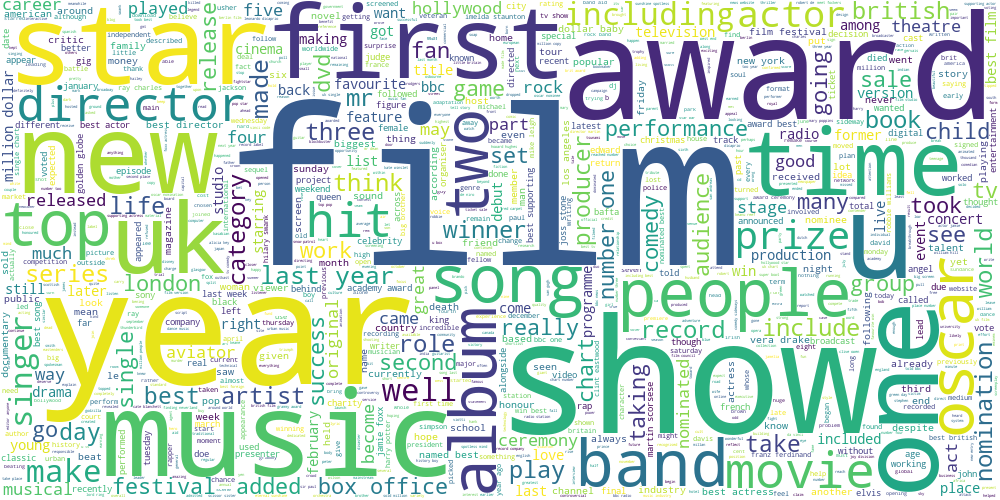

In [252]:
draw_wordcloud(data[labels == 0].text)

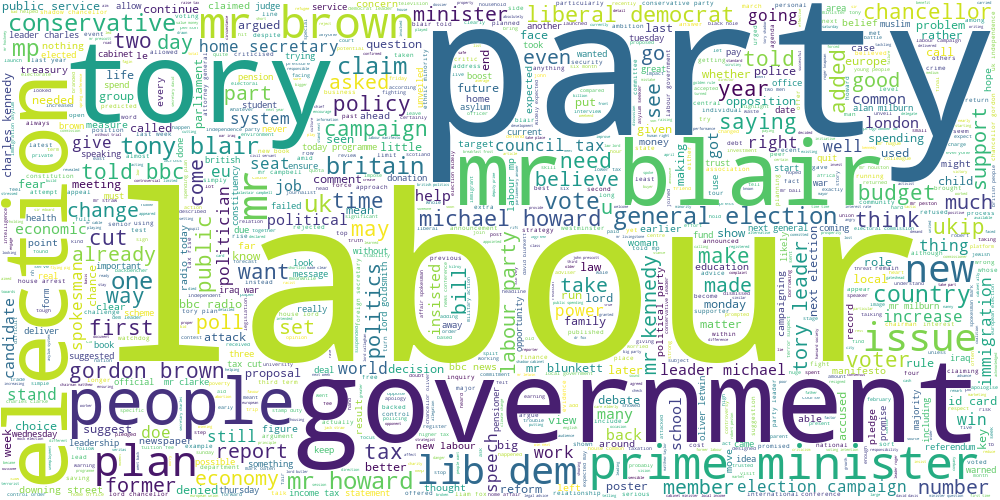

In [253]:
draw_wordcloud(data[labels == 1].text)

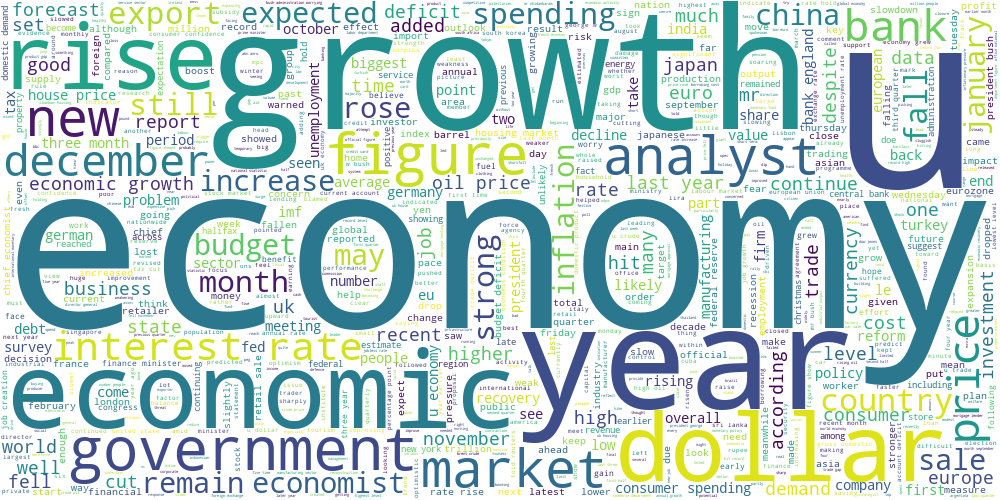

In [254]:
draw_wordcloud(data[labels == 2].text)

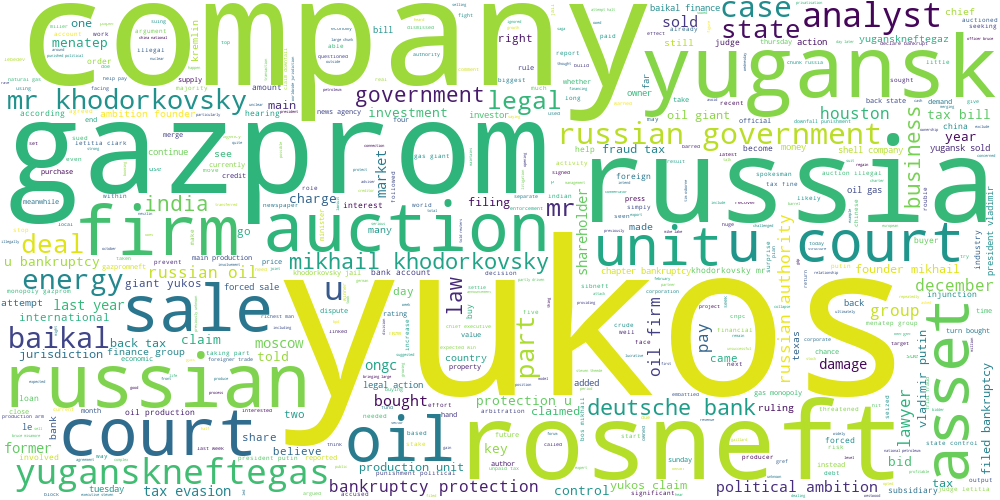

In [255]:
draw_wordcloud(data[labels == 3].text)

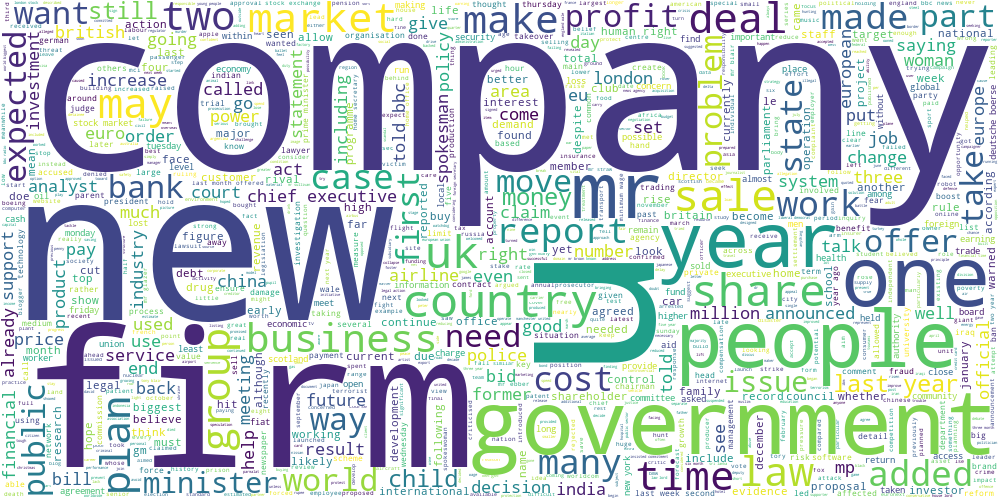

In [256]:
draw_wordcloud(data[labels == 4].text)

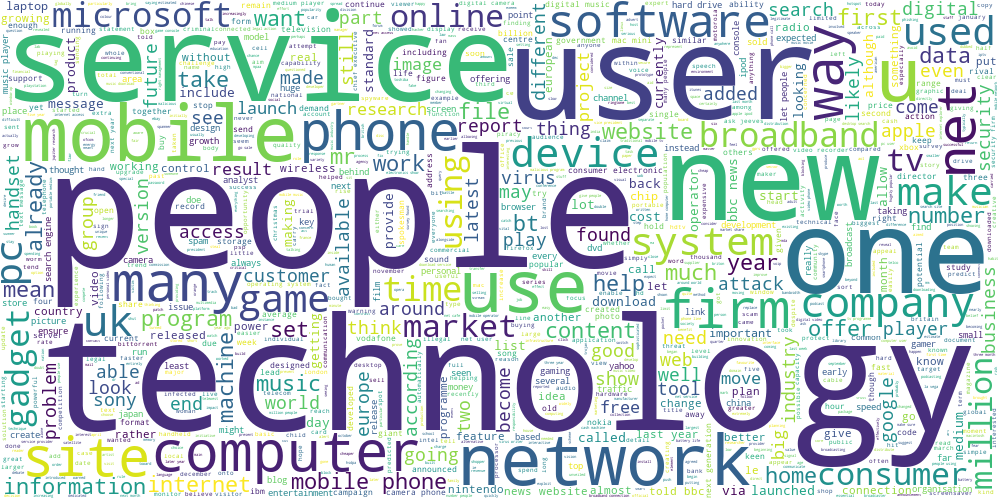

In [257]:
draw_wordcloud(data[labels == 5].text)

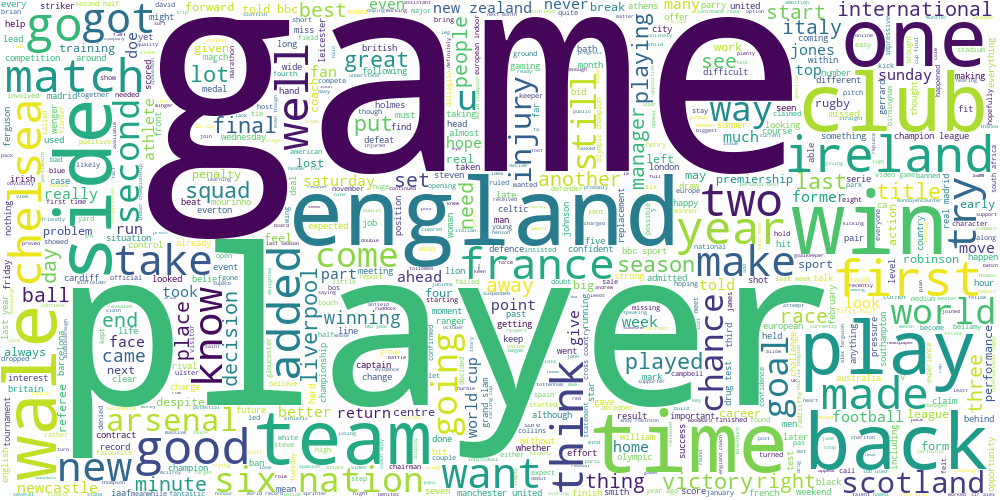

In [258]:
draw_wordcloud(data[labels == 6].text)

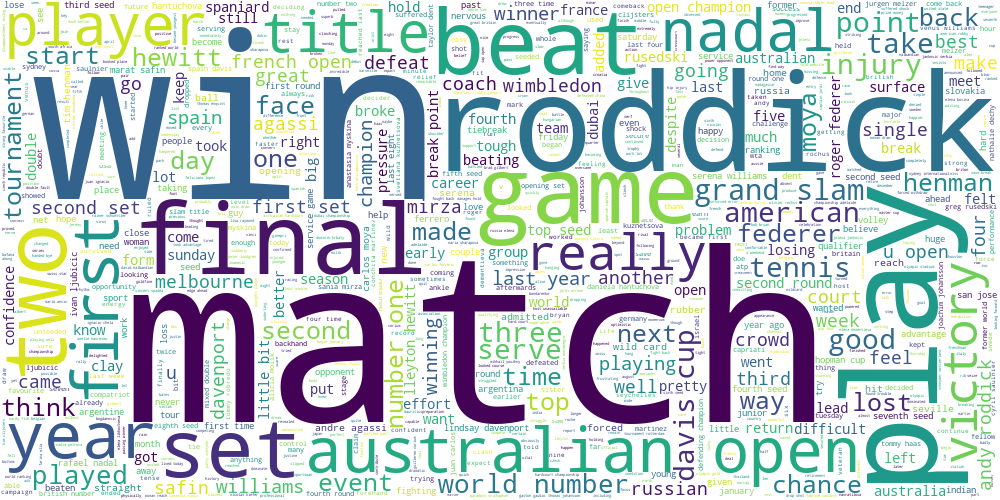

In [259]:
draw_wordcloud(data[labels == 7].text)

**Ваш ответ здесь:**

В целом, да, темы получились довольно интерпретируемы. Озаглавить их можно так: шоубизнесс, политика, экономика, нефть, бизнесс, технологии, футбол и спорт. Возможно некотрые группы стоит объединить(к примеру, спорт+футбол, нефть+бизнесс) и провести кластеризаци на меньшее число классов. 

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера (`kmeans.cluster_centers_`). 

* **(0.3 балла)** Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков tf-idf максимальны.
* **(0.2 балла)** (?) Согласуются ли полученные слова с облаками тегов из прошлого задания?

In [260]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
max_features = kmeans.cluster_centers_.argmax(axis=1)

In [261]:
max_features

array([ 4958,  8613,  4149, 14637,  8613,  8475,  5393,  9120],
      dtype=int64)

In [262]:
np.array(tf_idf.get_feature_names())[max_features]

array(['film', 'mr', 'economy', 'yukos', 'mr', 'mobile', 'game', 'open'],
      dtype='<U22')

**Ваш ответ здесь:**

В основном, да, полученные слова согласуются с облаками тегов. На на втором облаке мы видим, что слово "labour" более вырожено, чем "mr". Как и "company"/"firm"/"new" на 5. А на последней "match"/"win". Но полученные слова так же являеются хорошо выделенными.

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). 

* п.1 Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации. 
 * **(0.3 балла)** При этом для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров;
 * **(0.5 балла)** Подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.
* п.2 **(0.5 балла)** Обучите двухмерные t-SNE ([Почитать можно тут, часть 2](https://github.com/esokolov/ml-course-hse/blob/master/2020-fall/lecture-notes/lecture11-unsupervised.pdf), а также посмотреть непосредственно в [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html)) представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом.
* п.3 **(0.2 балла)** (?) Прокомментируйте получившиеся результаты. (?) Какой баланс кластеров получился у разных методов? (?) Соотносятся ли визуализации для текстов с визуализациями для географических данных?


**Замечания:**
* В этом задании используйте реализации спектральной кластеризации и t-SNE из `sklearn`
* В п.2 Лучше всего расположить визуализации на одном графике на трех разных сабплотах. 

**Подсказка:**
* Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [11]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
from sklearn.cluster import SpectralClustering
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

In [269]:
data_embedded = TSNE(n_components=2).fit_transform(data_tf)

In [317]:
kmeans = KMeans(n_clusters=6)
kmeans_labels = kmeans.fit_predict(data_tf)

In [315]:
spectr = SpectralClustering(n_clusters=6)
spectr_labels= spectr.fit_predict(data_tf)

In [477]:
dbscan = DBSCAN(eps = 1.26, min_samples=15)
dbscan_labels= dbscan.fit_predict(data_tf)

In [478]:
np.unique(dbscan_labels, return_counts=True)

(array([-1,  0,  1,  2,  3,  4,  5], dtype=int64),
 array([ 794, 1097,   71,   56,   13,  189,    5], dtype=int64))

In [480]:
colors = np.array(['red', 'lime', 'yellow', 'blue', 'purple', 'cyan', 'orange', 'deeppink', 'green', 
              'coral', 'gold', 'silver', 'brown', 'plum', 'snow', 'dimgray', 'teal', 'black'])
colors[dbscan_labels]

array(['black', 'red', 'red', ..., 'black', 'red', 'red'], dtype='<U8')

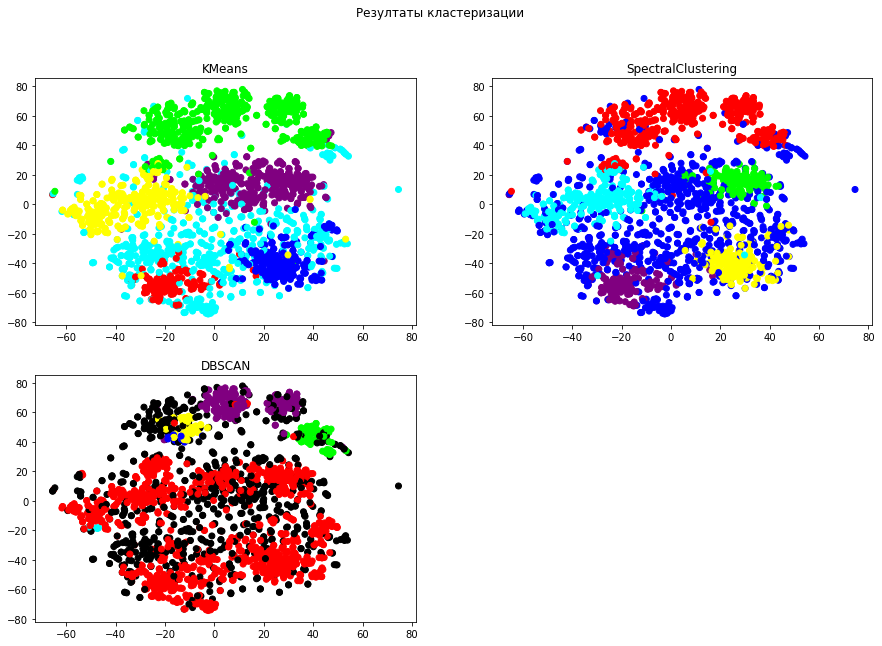

In [481]:
plt.figure(figsize=(15,10))
plt.suptitle('Резултаты кластеризации', fontsize=12)

plt.subplot(2, 2, 1) 
plt.title('KMeans')
plt.scatter(data_embedded[:, 0], data_embedded[:, 1], c=colors[kmeans_labels])

plt.subplot(2, 2, 2) 
plt.title('SpectralClustering')
plt.scatter(data_embedded[:, 0], data_embedded[:, 1], c=colors[spectr_labels])


plt.subplot(2, 2, 3)
plt.title('DBSCAN')
plt.scatter(data_embedded[:, 0], data_embedded[:, 1], c=colors[dbscan_labels])
plt.show()

**Ваш ответ здесь:**

Заметим, что результаты KMeans и SpectralClustering практически идентичны. В основном у них кластеры имеют одинаковые размеры. Но пара кластеров чуть меньше чем другие. DBSCAN же в основном нижние точки отнёс либо к красному кластеру, либо пометил шумовыми(чёрные). Таким образом, получился один большой кластер и ещё несколько мелких. Нельзя сказать, что данные визуализации соотносятся с географическими данными. Так как мы можем увидеть объекты одного кластера и сверху, и снизу, некоторые кластеры перемешаны друг с другом (бирюзовый кластер в KMeans пересекается со всеми другими), чего не было в предыдущем пункте данного задания.

**Задание 2.4 (1.5 балла).** 

* **(0.5 балла)**  Обучите модель латентного размещения Дирихле (LDA).
* **(0.5 балла)**  Придумайте как превратить распределение тем для текста в номер его кластера. Опишите текстом (?) и приведите код и результаты его работы
* **(0.5 балла)** Возьмите параметр `n_components` у LDA в 2-3 раза больше, чем число кластеров для K-Means, и вновь посмотрите на темы. (?) Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Замечания:**
* Реализацию LDA во всех заданиях используйте из `sklearn` (LatentDirichletAllocation)

**Подсказка:**
* Не забудьте, что LDA работает с мешком слов, а не с tf-idf признаками.

**Ключевые слова:**
* *CountVectorizer,  LatentDirichletAllocation*

In [12]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

In [13]:
cnt = CountVectorizer(min_df=5e-4)
data_cnt = cnt.fit_transform(data['text'])
data_cnt

<2225x14682 sparse matrix of type '<class 'numpy.int64'>'
	with 306811 stored elements in Compressed Sparse Row format>

Номер кластера возьмём, как аргмаксимум распределения вероятностей тем.

In [524]:
lda = LatentDirichletAllocation(n_components=6)
probs = lda.fit_transform(data_cnt)
labels = probs.argmax(axis=1)
np.unique(labels, return_counts=True)

(array([0, 1, 2, 3, 4, 5], dtype=int64),
 array([513, 442, 388, 299, 218, 365], dtype=int64))

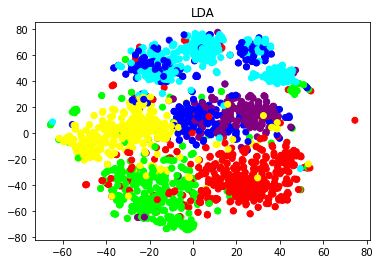

In [525]:
plt.title('LDA')
plt.scatter(data_embedded[:, 0], data_embedded[:, 1], c=colors[labels])
plt.show()

In [536]:
lda = LatentDirichletAllocation(n_components=10)
probs = lda.fit_transform(data_cnt)
labels = probs.argmax(axis=1)
np.unique(labels, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int64),
 array([240, 162,  90,  71, 284, 464,  99, 213, 157, 445], dtype=int64))

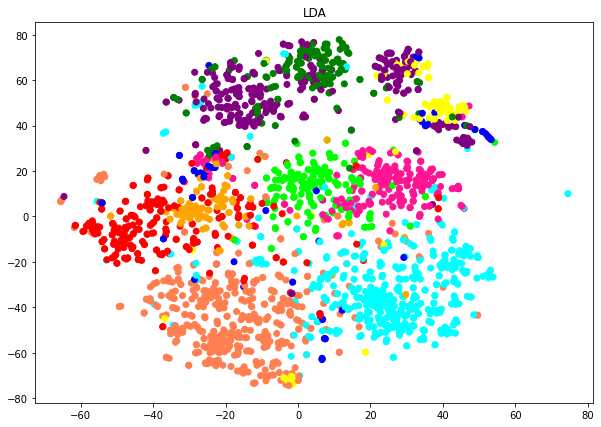

In [537]:
plt.figure(figsize=(10, 7))
plt.title('LDA')
plt.scatter(data_embedded[:, 0], data_embedded[:, 1], c=colors[labels])
plt.show()

In [528]:
lda = LatentDirichletAllocation(n_components=15)
probs = lda.fit_transform(data_cnt)
labels = probs.argmax(axis=1)
np.unique(labels, return_counts=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14],
       dtype=int64),
 array([239,  87, 282, 110, 270, 163,  50, 232, 281,  25,  79, 246,  38,
         44,  79], dtype=int64))

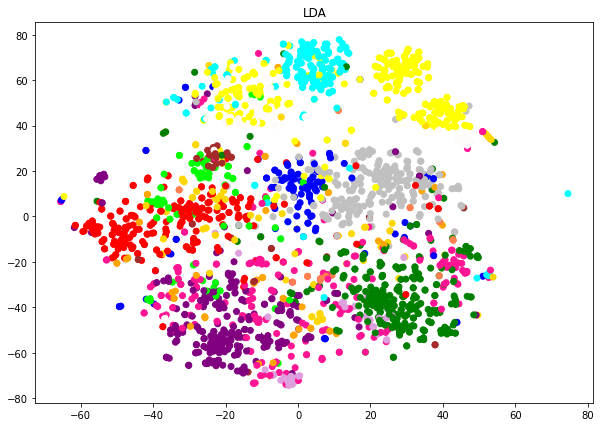

In [530]:
plt.figure(figsize=(10, 7))
plt.title('LDA')
plt.scatter(data_embedded[:, 0], data_embedded[:, 1], c=colors[labels])
plt.show()

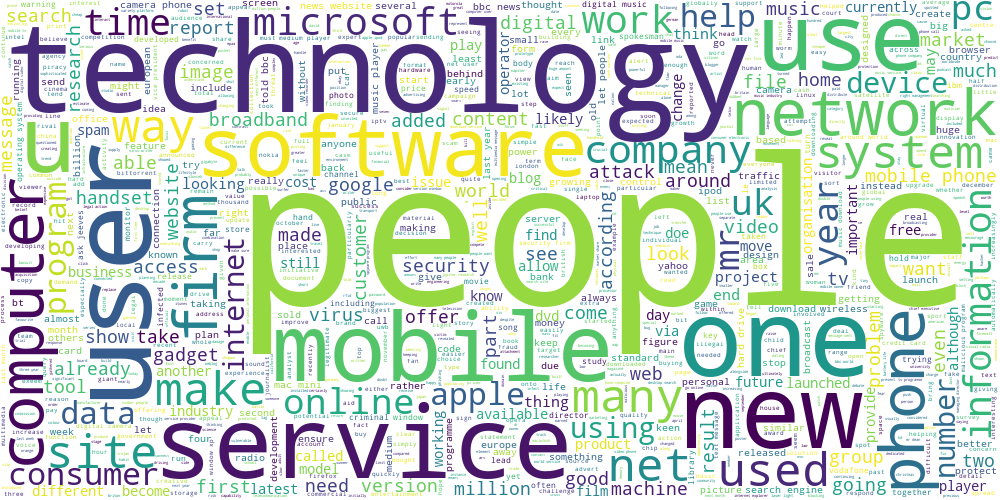

In [532]:
draw_wordcloud(data[labels == 0].text)

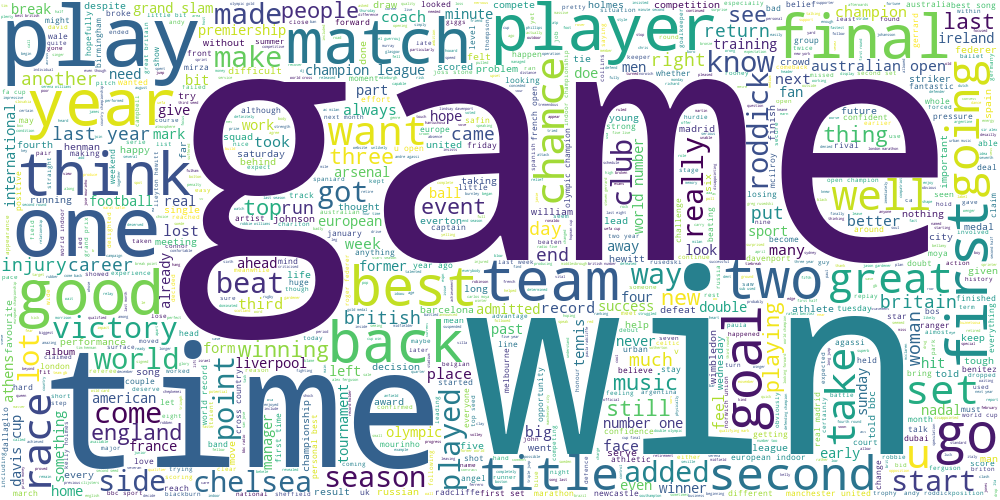

In [533]:
draw_wordcloud(data[labels == 2].text)

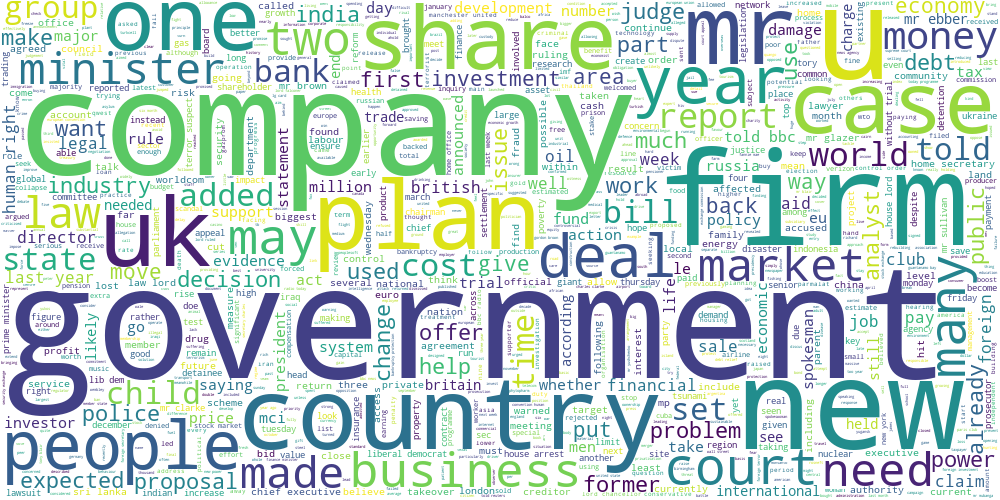

In [535]:
draw_wordcloud(data[labels == 7].text)

**Ваш ответ здесь:**

Номер кластера возьмём, как аргмаксимум распределения вероятностей тем. Если взять, параметр n_components у LDA в 2-3 раза больше, чем число кластеров для K-Means, то некоторые темы получаются более узкими.

## Часть 3. Transfer learning для задачи классификации текстов

**Замечание для всей части 3:**
* Для возможности получения **полного балла** accuracy всех алгоритмов на тесте должны быть не ниже 0.75, а также хотя бы один из рассмотренных в этой части алгоритмов должен достигнуть точности не менее 0.95 на тесте.

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей 🌚🌝. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

* **(0.4 балла)** Разделите выборку на обучающую и тестовую, замерьте accuracy на обеих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.
* **(0.1 балла)** (?) У какой модели получилось лучшее качество? (?) С чем это связано?

**Подсказка:**
* Во второй модели расстояния до центров кластеров можно получиться при помощи метода KMeans.transform

**Ключевые слова:**
* *OrdinalEncoder, TfidfVectorizer, CountVectorizer, train_test_split, KMeans.transform*

In [30]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

In [73]:
X_train, X_test, y_train, y_test = train_test_split(data['text'], data['category'], test_size=0.3, random_state=10)

In [86]:
tf_idf = TfidfVectorizer(min_df=5e-4)
X_train_tf = tf_idf.fit_transform(X_train)
X_test_tf = tf_idf.transform(X_test)

In [95]:
cnt = CountVectorizer()
X_train_cnt = cnt.fit_transform(X_train)
X_test_cnt = cnt.transform(X_test)

In [78]:
logreg = LogisticRegression()

1) Логистическая регрессия на tf-idf признаках

In [90]:
logreg.fit(X_train_tf, y_train)
y_pred_test = logreg.predict(X_test_tf)
y_pred_train = logreg.predict(X_train_tf)

In [91]:
print(f'Accuracy logreg on train: {(y_pred_train == y_train).mean()}')
print(f'Accuracy logreg on test: {(y_pred_test == y_test).mean()}')

Accuracy logreg on train: 0.9967886962106616
Accuracy logreg on test: 0.9775449101796407


2) K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров

In [87]:
kmeans = KMeans()
X_train_trans = kmeans.fit_transform(X_train_tf)
X_test_trans = kmeans.transform(X_test_tf)

In [88]:
logreg.fit(X_train_trans, y_train)
y_pred_test = logreg.predict(X_test_trans)
y_pred_train = logreg.predict(X_train_trans)

In [89]:
print(f'Accuracy kmeans + logreg on train: {(y_pred_train == y_train).mean()}')
print(f'Accuracy kmeans + logreg on test: {(y_pred_test == y_test).mean()}')

Accuracy kmeans + logreg on train: 0.8227360308285164
Accuracy kmeans + logreg on test: 0.7979041916167665


3) Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

In [97]:
lda = LatentDirichletAllocation()
probs_train = lda.fit_transform(X_train_cnt)
probs_test = lda.transform(X_test_cnt)

In [98]:
logreg.fit(probs_train, y_train)
y_pred_test = logreg.predict(probs_test)
y_pred_train = logreg.predict(probs_train)

In [99]:
print(f'Accuracy LDA + logreg on train: {(y_pred_train == y_train).mean()}')
print(f'Accuracy LDA + logreg on test: {(y_pred_test == y_test).mean()}')

Accuracy LDA + logreg on train: 0.8227360308285164
Accuracy LDA + logreg on test: 0.8937125748502994


**Ваш ответ здесь:**

Наилучшее качество получилось у логистической регрессии. Возможно кластеризация не показала хорошего качества, так как некоторые темы перепутаны и смешаны друг с другом(как мы видим на графиках из прошлого задания). К тому же центры кластеров задаются случайно, поэтому не удаётся чётко отделить классы.

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры (tf-idf, bag_of_words) и алгоритмы кластеризации (KMeans)) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%).

* **(1.2 балла)** Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 
* **(0.3 балла)** (?) Как изменились результаты по сравнению с обучением на полной разметке? (?) Сделайте выводы.

**Пояснение:**
* Тестовую выборку возьмите из задания 3.1. А разделять надо тренировочную из 3.1
* Обучаете векторайзер на 70%, применяете векторайзер к 5%, и на этих 5% уже обучаете классификатор.
* Итак, берем 3 варианта обучения из задания 3.1. Вы должны:
 * 1-я модель. Подобрать оптимальный гиперпараметр С у LogisticRegression на tf-idf признаках. Выбираем оптимальный параметр по валидационной выборке. Далее оцениваем обученную модель с оптимальном параметром на тесте.
 * 2-я модель. Шаг 1. Подобрать оптимальный гиперпараметр n_clusters у KMeans на tf-idf признаках: перебираем значения n_clusters и при каждом значении обучаем LogisticRegression на дефолтных параметрах (быть может с ограничением max_iter, об этом ниже). То есть классификатор в данном случае будет на одинаковых параметрах для всех представителей семейства алгоритмов KMeans. Далее выбираете оптимальный n_clusters по качеству классификатора на валидационной выборке. Шаг 2. Обучаете KMeans с оптимальным n_clusters и перебираете значение C у LogisticRegression. Также выбираете оптмальное по валидации. И только после двух подобранных оптимальных параметров выводите качество на тесте.
 * 3-я модель. Аналогично второй, только вместо KMeans --- LatentDirichletAllocation, а вместо tf-idf -- bag of words.

**Замечания:**
* Параметр $С$ у LogisticRegression перебирайте *по логарифмической сетке.* Обратите внимание, что $С$ НЕ перед регуляризатором, поэтому, скорее всего, наиболее оптимальными будут большие значения $C$. **Для возможности получения полного балла** переберите хотя бы 20 параметров, и затроньте значения в 1e-2 и 1e6 (по большей части значения должны лежать в этом отрезке)
* **Для возможности получения полного балла** параметр n_clusters у KMeans при переборе должен затрагивать значения в 10 и 1000 кластеров (по большей части значения должны лежать в этом отрезке), а также должно быть перебрано не менее 20 значений кластеров *(по линейной сетке)*
* **Для возможности получения полного балла** параметр n_components у LDA при переборе должен затрагивать значения в 5 и 14 (по большей части значения должны лежать в этом отрезке), а также должно быть перебрано не меньше 10 различных значений *(по линейной сетке)*

**Подсказка:**
* Может быть для ограничения времени обучения лучше будет ограничить параметр max_iter в LogisticRegression, равным, например, 1000

In [105]:
X_train_train, X_val, y_train_train, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=10)

In [113]:
X_train_not_mark, X_train_mark, y_train_not_mark, y_train_mark = train_test_split(X_train_train, y_train_train, test_size=0.071, random_state=10)

In [115]:
X_train_mark.shape, X_train_not_mark.shape, X_train_train.shape, X_val.shape, X_train.shape, X_test.shape

((78,), (1011,), (1089,), (468,), (1557,), (668,))

In [121]:
tf_idf = TfidfVectorizer()
X_train_train_tf = tf_idf.fit_transform(X_train_train)
X_test_tf = tf_idf.transform(X_test)
X_train_mark_tf = tf_idf.transform(X_train_mark)
X_val_tf = tf_idf.transform(X_val)

In [124]:
cnt = CountVectorizer()
X_train_train_cnt = cnt.fit_transform(X_train_train)
X_test_cnt = cnt.transform(X_test)
X_train_mark_cnt = cnt.transform(X_train_mark)
X_val_cnt = cnt.transform(X_val)

1) Логистическая регрессия

In [138]:
C = np.logspace(-2, 6, 20)
acc_val, acc_train = [], []
for c in C:
    logreg = LogisticRegression(max_iter=1000, C=c)
    logreg.fit(X_train_mark_tf, y_train_mark)
    acc_val.append((logreg.predict(X_val_tf) == y_val).mean())
    acc_train.append((logreg.predict(X_train_mark_tf) == y_train_mark).mean())

In [165]:
def plot(x, y, labels, title, xlabel, logscale=True):
    plt.figure(figsize=(13,7))

    for acc, label in zip(y, labels):
        plt.plot(x, acc, label=label)
    
    plt.title(title, fontsize=15)
    plt.grid(True)
    if logscale:
        plt.xscale("log")
    plt.ylabel("Accuracy",  fontsize=15)
    plt.xlabel(xlabel,  fontsize=15)
    plt.legend(fontsize=15)

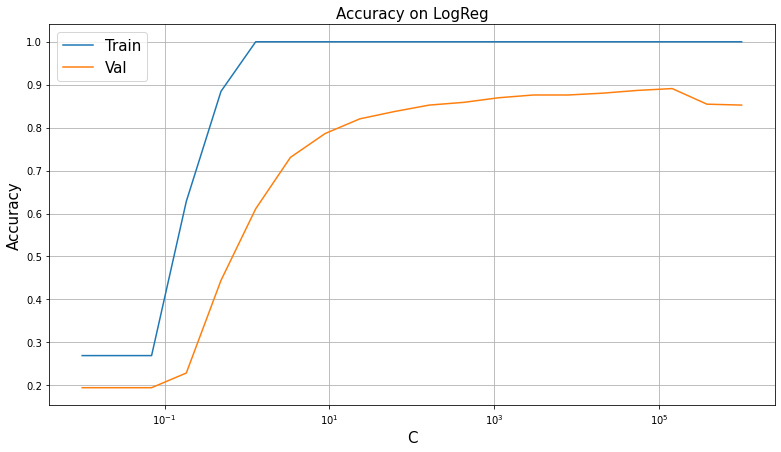

In [142]:
title = 'Accuracy on LogReg'
plot(C, [acc_train, acc_val], ["Train", "Val"], title, 'C')

In [255]:
logreg = LogisticRegression(C=1e+5)
logreg.fit(X_train_mark_tf, y_train_mark)
print(f'Accuracy logreg on test: {(logreg.predict(X_test_tf) == y_test).mean()}')

Accuracy logreg on test: 0.8697604790419161


2) KMeans

In [162]:
n_clusters = np.linspace(10, 1000, 20, dtype=int)
acc_val, acc_train = [], []
for n in n_clusters:
    kmeans = KMeans(n_clusters=n)
    X_train_trans = kmeans.fit_transform(X_train_train_tf)
    X_mark_trans = kmeans.transform(X_train_mark_tf)
    X_val_trans = kmeans.transform(X_val_tf)
    
    logreg = LogisticRegression(max_iter=1000)
    logreg.fit(X_mark_trans, y_train_mark)
    acc_val.append((logreg.predict(X_val_trans) == y_val).mean())
    acc_train.append((logreg.predict(X_mark_trans) == y_train_mark).mean())

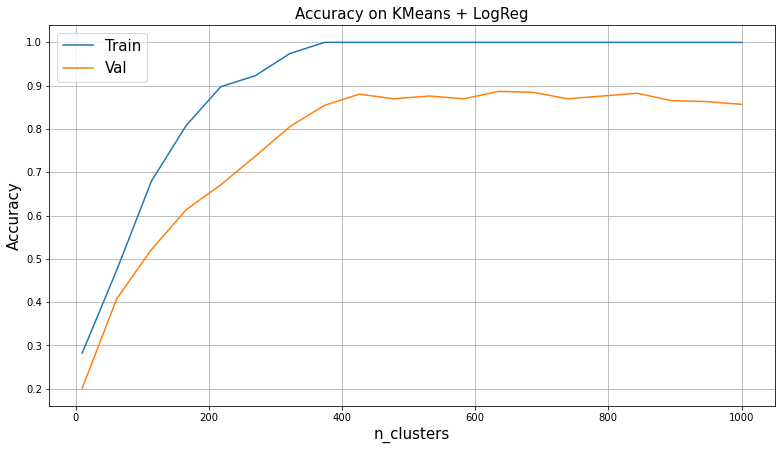

In [166]:
title = 'Accuracy on KMeans + LogReg'
plot(n_clusters, [acc_train, acc_val], ["Train", "Val"], title, 'n_clusters', logscale=False)

In [167]:
C = np.logspace(-2, 6, 20)
n=600
acc_val, acc_train = [], []

kmeans = KMeans(n_clusters=n)
kmeans.fit(X_train_train_tf)
X_mark_trans = kmeans.transform(X_train_mark_tf)
X_val_trans = kmeans.transform(X_val_tf)

for c in n_clusters:
    logreg = LogisticRegression(max_iter=1000, C=c)
    logreg.fit(X_mark_trans, y_train_mark)
    acc_val.append((logreg.predict(X_val_trans) == y_val).mean())
    acc_train.append((logreg.predict(X_mark_trans) == y_train_mark).mean())

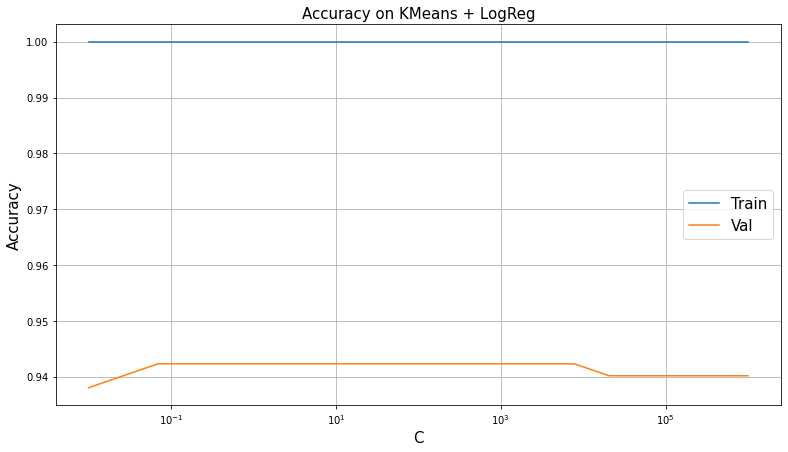

In [168]:
title = 'Accuracy on KMeans + LogReg'
plot(C, [acc_train, acc_val], ["Train", "Val"], title, 'C')

In [170]:
kmeans = KMeans(n_clusters=n)
kmeans.fit(X_train_train_tf)
X_mark_trans = kmeans.transform(X_train_mark_tf)
X_test_trans = kmeans.transform(X_test_tf)

In [175]:
logreg = LogisticRegression(max_iter=1000, C=1e+4)
logreg.fit(X_mark_trans, y_train_mark)
print(f'Accuracy kmeans + logreg on test: {(logreg.predict(X_test_trans) == y_test).mean()}')

Accuracy kmeans + logreg on test: 0.9610778443113772


3) LDA

In [183]:
n_components = np.linspace(5, 14, 10, dtype=int)
acc_val, acc_train = [], []
for n in n_components:
    lda = LatentDirichletAllocation(n_components=n)
    lda.fit(X_train_train_cnt)
    probs_mark = lda.transform(X_train_mark_cnt)
    probs_val = lda.transform(X_val_cnt)
    
    logreg = LogisticRegression(max_iter=1000)
    logreg.fit(probs_mark, y_train_mark)
    acc_val.append((logreg.predict(probs_val) == y_val).mean())
    acc_train.append((logreg.predict(probs_mark) == y_train_mark).mean())

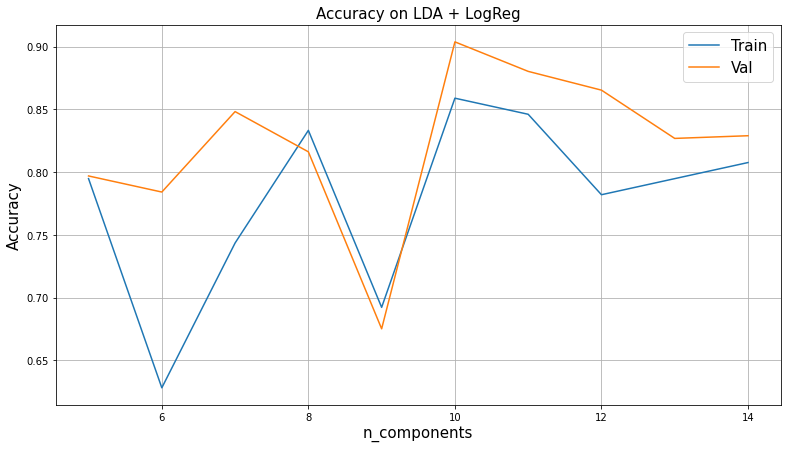

In [184]:
title = 'Accuracy on LDA + LogReg'
plot(n_components, [acc_train, acc_val], ["Train", "Val"], title, 'n_components', logscale=False)

In [234]:
C = np.logspace(-2, 6, 20)
n=10
acc_val, acc_train = [], []

lda = LatentDirichletAllocation(n_components=n)
lda.fit(X_train_train_cnt)
probs_mark = lda.transform(X_train_mark_cnt)
probs_val = lda.transform(X_val_cnt)

for c in n_clusters:
    logreg = LogisticRegression(max_iter=1000, C=c)
    logreg.fit(probs_mark, y_train_mark)
    acc_val.append((logreg.predict(probs_val) == y_val).mean())
    acc_train.append((logreg.predict(probs_mark) == y_train_mark).mean())

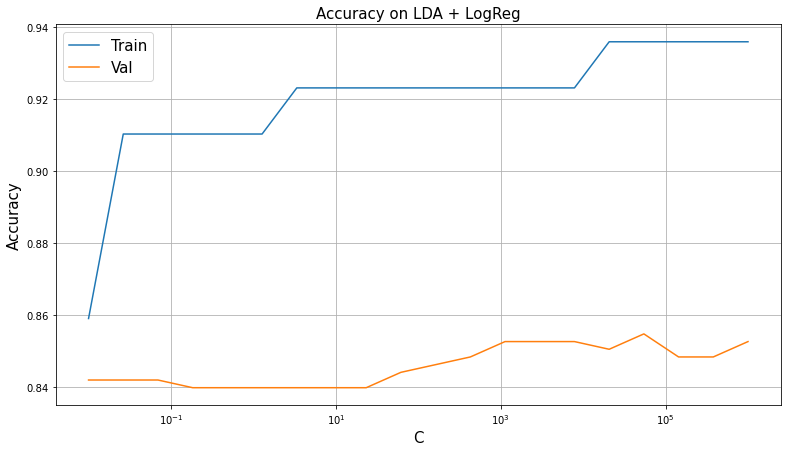

In [236]:
title = 'Accuracy on LDA + LogReg'
plot(C, [acc_train, acc_val[::-1]], ["Train", "Val"], title, 'C')

In [237]:
probs_test = lda.transform(X_test_cnt)

In [251]:
logreg = LogisticRegression(max_iter=1000, C=5e+4)
logreg.fit(probs_mark, y_train_mark)
print(f'Accuracy kmeans + logreg on test: {(logreg.predict(probs_test) == y_test).mean()}')

Accuracy kmeans + logreg on test: 0.844311377245509


**Ваш ответ здесь:**

Заметим, что качество на лог регрессии довольно сильно упало. Это можно объяснить тем, что в обучающей выборке стало намного меньше объектов, поэтому нашей модели сложно выделить закономерности. Напротив, KMeans показал очень хорошее качество. Вероятно это связано с тем, что увеличивая количество кластеров, мы сильно уменьшаем количество объектов в каждой группе. Поэтому они скорее всего все будут состять из текстов из одного класса. И так из полученных "подтем" мы можем практически безошибочно восстановить все темы. У LDA качество немного упало. Вероятно это связано с маленьким объёмом обучающей выборки и не совсем точным разделением на классы. Возможно стоит попробовать увеличить число компонент для более чёткой классификации.

## Бонус

**Задание 4 (1 балл)**. 

* **(Максимум 0.8 балла, 0.4 балла за каждый исследованный метод)** Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. 
* **(0.2 балла)** (?) Получилось ли добиться лучшего качества? (?) Сделайте выводы.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 5 (1 балл)**. Существует метрика BCubed ([Ссылка 1](https://github.com/esokolov/ml-course-hse/blob/master/2020-spring/lecture-notes/lecture17-clusterization.pdf), [Ссылка 2](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf)), которая хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). 

* **(0.2 балла)** Реализуйте подсчет метрики BCubed
* **(0.8 балла)** (?) Сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

**Замечание:**
* Пользоваться готовыми библиотечными методами для вычисления BCubed нельзя

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Ваш ответ здесь:**

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии🧙.

* Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). (?) Напишите, откуда брали данные и что это за данные
* **(1.7 балла)** Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое.
* **(0.3 балла)** (?) Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! 

**Подсказка:**
* Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (0.1 балла)**. Опишите свои ощущения от этой домашки🥔

В целом то прикольненькое заданьице, было б времени побольше... Для этого предлагаю в следующий раз дедлы по праку, оир и ммро сделать в один день. Можно ещё Дьяконова подкинуть и курсач.  А то как-то скучно я др праздновал, всего лишь 2 дедлы... 